In [1]:
pip install tdqm

Note: you may need to restart the kernel to use updated packages.


In [5]:
# Basic Libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
pd.plotting.register_matplotlib_converters()
%matplotlib inline
import seaborn as sns

# Specific Libraries
import os
import librosa
import librosa.display

from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report
from sklearn.model_selection import GridSearchCV
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import train_test_split 
from sklearn.preprocessing import LabelEncoder

from tqdm import tqdm, trange
from tqdm.auto import tqdm

import tensorflow as tf
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense , Activation , Dropout

import IPython.display as ipd

In [6]:
pip install tdqm

In [7]:
df = pd.read_csv("C:\\Users\\sanas\\OneDrive\\urbanexdata\\UrbanSound8K.csv")
df.head()

,slice_file_name,fsID,start,end,salience,fold,classID,class
0,100032-3-0-0.wav,100032,0.0,0.317551,1,5,3,dog_bark
1,100263-2-0-117.wav,100263,58.5,62.500000,1,5,2,children_playing
2,100263-2-0-121.wav,100263,60.5,64.500000,1,5,2,children_playing
3,100263-2-0-126.wav,100263,63.0,67.000000,1,5,2,children_playing
4,100263-2-0-137.wav,100263,68.5,72.500000,1,5,2,children_playing


In [8]:
dat1, sampling_rate1 = librosa.load('C:\\Users\\sanas\\Downloads\\6902-2-0-7.wav')
dat2, sampling_rate2 = librosa.load("C:\\Users\\sanas\\OneDrive\\urbanexdata\\fold5\\65381-3-0-7.wav")

Text(0.5, 1.0, 'Linear-frequency power spectrogram')

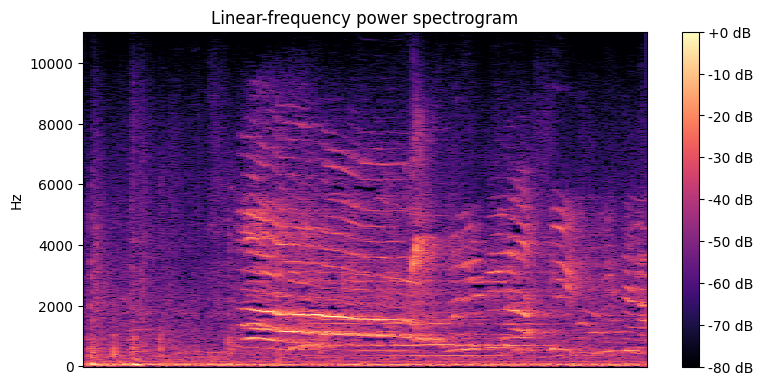

In [9]:
plt.figure(figsize=(20, 20))
D = librosa.amplitude_to_db(np.abs(librosa.stft(dat1)), ref=np.max)
plt.subplot(4, 2, 1)
librosa.display.specshow(D, y_axis='linear')
plt.colorbar(format='%+2.0f dB')
plt.title('Linear-frequency power spectrogram')

In [10]:
dat2

array([5.3907547e-04, 7.8199140e-04, 5.7831925e-04, ..., 4.1042948e-01,
       5.1560915e-01, 7.8629386e-01], dtype=float32)

In [11]:
dat1

array([ 0.02293396,  0.02362061,  0.02113342, ..., -0.02062988,
        0.02101135,  0.04855347], dtype=float32)

Text(0.5, 1.0, 'Linear-frequency power spectrogram')

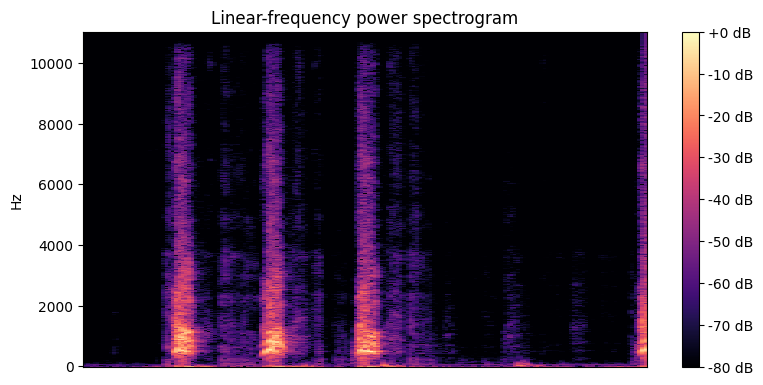

In [12]:
plt.figure(figsize=(20, 20))
D = librosa.amplitude_to_db(np.abs(librosa.stft(dat2)), ref=np.max)
plt.subplot(4, 2, 1)
librosa.display.specshow(D, y_axis='linear')
plt.colorbar(format='%+2.0f dB')
plt.title('Linear-frequency power spectrogram')

In [13]:
def features_extract(file):
    sample,sample_rate = librosa.load(file_name,res_type='kaiser_fast')
    feature = librosa.feature.mfcc(y=sample,sr=sample_rate,n_mfcc=50)
    scaled_feature = np.mean(feature.T,axis=0)
    return scaled_feature

extracted = []
path = "C:\\Users\\sanas\\OneDrive\\urbanexdata"

for index_num,row in tqdm(df.iterrows()):
    file_name = os.path.join(os.path.abspath(path),'fold'+str(row["fold"])+'/',str(row['slice_file_name'])) 
    final_class_labels = row['class']   
    data= features_extract(file_name)    
    extracted.append([data,final_class_labels])

3554it [02:41, 21.69it/s]C:\Users\sanas\AppData\Local\Programs\Python\Python311\Lib\site-packages\librosa\core\spectrum.py:256: UserWarning: n_fft=2048 is too large for input signal of length=1323
  warnings.warn(
8326it [06:11, 29.64it/s]C:\Users\sanas\AppData\Local\Programs\Python\Python311\Lib\site-packages\librosa\core\spectrum.py:256: UserWarning: n_fft=2048 is too large for input signal of length=1103
  warnings.warn(
C:\Users\sanas\AppData\Local\Programs\Python\Python311\Lib\site-packages\librosa\core\spectrum.py:256: UserWarning: n_fft=2048 is too large for input signal of length=1523
  warnings.warn(
8732it [06:28, 22.49it/s]


In [14]:
ext_df = pd.DataFrame(extracted,columns=['feature','class'])
ext_df

,feature,class
0,"[-217.35526, 70.22338, -130.38527, -53.282898,...",dog_bark
1,"[-424.09818, 109.34077, -52.919525, 60.86475, ...",children_playing
2,"[-458.79114, 121.38419, -46.52066, 52.00812, -...",children_playing
3,"[-413.89984, 101.66373, -35.42945, 53.036354, ...",children_playing
4,"[-446.60352, 113.68541, -52.402214, 60.302044,...",children_playing
...,...,...
8727,"[-398.5845, 135.53496, -50.725018, 35.855907, ...",car_horn
8728,"[-346.4742, 86.34815, -45.16857, 51.709873, -3...",car_horn
8729,"[-303.88824, 111.35945, -45.941566, 35.87702, ...",car_horn
8730,"[-344.11008, 125.45021, -54.903442, 34.891155,...",car_horn


In [18]:
ext_df.to_csv('extracteddf.csv', index=False)

In [19]:
x = np.array(ext_df['feature'].tolist())
y = np.array(ext_df['class'].tolist())

In [20]:
le = LabelEncoder()

y = to_categorical(le.fit_transform(y))

In [21]:
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.2, random_state = 42)

print("Number of training samples = ", x_train.shape[0])
print("Number of testing samples = ",x_test.shape[0])

Number of training samples =  6985
Number of testing samples =  1747


In [22]:
num_labels = 10  # Replace with the actual number of labels in your dataset

model = Sequential()
#num_labels = y.shape[1]
model = Sequential()

model.add(Dense(128, input_shape=(50,)))
model.add(Activation('relu'))
model.add(Dropout(0.5))

model.add(Dense(256))
model.add(Activation('relu'))
model.add(Dropout(0.5))
model.add(Dense(256))
model.add(Activation('relu'))
model.add(Dropout(0.5))
model.add(Dense(128))

model.add(Dense(num_labels))
model.add(Activation('softmax'))

model.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 128)               6528      
                                                                 
 activation (Activation)     (None, 128)               0         
                                                                 
 dropout (Dropout)           (None, 128)               0         
                                                                 
 dense_1 (Dense)             (None, 256)               33024     
                                                                 
 activation_1 (Activation)   (None, 256)               0         
                                                                 
 dropout_1 (Dropout)         (None, 256)               0         
                                                                 
 dense_2 (Dense)             (None, 256)              

In [23]:
model.compile(optimizer=tf.keras.optimizers.Adam(),
              loss=tf.keras.losses.CategoricalCrossentropy(),
              metrics=['accuracy'])

In [24]:
from tensorflow.keras.callbacks import ModelCheckpoint
checkpointer = ModelCheckpoint(filepath="C:\\Users\\sanas\\OneDrive\\saved_models\\finalmodellast.hdf5",
                               verbose=1, save_best_only=True)
model.fit(
          x_train, 
          y_train, 
          batch_size=50, 
          epochs=200,
          validation_data=(x_test, y_test),callbacks=[checkpointer]
         )

Epoch 1/200
140/140 [==============================] - ETA: 0s - loss: 10.8387 - accuracy: 0.1480
Epoch 1: val_loss improved from inf to 2.11353, saving model to C:\Users\sanas\OneDrive\saved_models\finalmodellast.hdf5
140/140 [==============================] - 2s 7ms/step - loss: 10.8387 - accuracy: 0.1480 - val_loss: 2.1135 - val_accuracy: 0.2524
Epoch 2/200
129/140 [==========================>...] - ETA: 0s - loss: 2.5482 - accuracy: 0.1936
Epoch 2: val_loss improved from 2.11353 to 2.09677, saving model to C:\Users\sanas\OneDrive\saved_models\finalmodellast.hdf5
140/140 [==============================] - 1s 6ms/step - loss: 2.5233 - accuracy: 0.1960 - val_loss: 2.0968 - val_accuracy: 0.2066
Epoch 3/200
133/140 [===========================>..] - ETA: 0s - loss: 2.1583 - accuracy: 0.2305
Epoch 3: val_loss improved from 2.09677 to 2.00690, saving model to C:\Users\sanas\OneDrive\saved_models\finalmodellast.hdf5
140/140 [==============================] - 1s 6ms/step - loss: 2.1502 - ac

In [25]:
def extract_feature(file_name):
    audio_data, sample_rate = librosa.load(file_name, res_type='kaiser_fast') 
    fea = librosa.feature.mfcc(y=audio_data, sr=sample_rate, n_mfcc=50)
    scaled = np.mean(fea.T,axis=0)
    return np.array([scaled])

In [26]:
def predict(file_name):
    pred_fea = extract_feature(file_name) 
    pred_vector = np.argmax(model.predict(pred_fea), axis=-1)
    pred_class = le.inverse_transform(pred_vector)
    return pred_class[0]

In [27]:
df

,slice_file_name,fsID,start,end,salience,fold,classID,class
0,100032-3-0-0.wav,100032,0.000000,0.317551,1,5,3,dog_bark
1,100263-2-0-117.wav,100263,58.500000,62.500000,1,5,2,children_playing
2,100263-2-0-121.wav,100263,60.500000,64.500000,1,5,2,children_playing
3,100263-2-0-126.wav,100263,63.000000,67.000000,1,5,2,children_playing
4,100263-2-0-137.wav,100263,68.500000,72.500000,1,5,2,children_playing
...,...,...,...,...,...,...,...,...
8727,99812-1-2-0.wav,99812,159.522205,163.522205,2,7,1,car_horn
8728,99812-1-3-0.wav,99812,181.142431,183.284976,2,7,1,car_horn
8729,99812-1-4-0.wav,99812,242.691902,246.197885,2,7,1,car_horn
8730,99812-1-5-0.wav,99812,253.209850,255.741948,2,7,1,car_horn


In [28]:
test_accuracy=model.evaluate(x_test,y_test,verbose=0)
print(test_accuracy[1])

0.8620492219924927


In [29]:
predict("C:\\Users\\sanas\\OneDrive\\urbanexdata\\fold8\\34866-9-0-3.wav")
ipd.Audio("C:\\Users\\sanas\\OneDrive\\urbanexdata\\fold8\\34866-9-0-3.wav")

1/1 [==============================] - 0s 96ms/step


In [30]:
predict("C:\\Users\\sanas\\OneDrive\\urbanexdata\\fold8\\33340-7-10-0.wav")
ipd.Audio("C:\\Users\\sanas\\OneDrive\\urbanexdata\\fold8\\33340-7-10-0.wav")

1/1 [==============================] - 0s 29ms/step


In [31]:
predict("C:\\Users\\sanas\\Downloads\\group_of_dogs_barking-7013.wav")
ipd.Audio("C:\\Users\\sanas\\Downloads\\group_of_dogs_barking-7013.wav")

1/1 [==============================] - 0s 23ms/step


In [32]:
predict("C:\\Users\\sanas\\Downloads\\car-horn-90973.wav")
ipd.Audio("C:\\Users\\sanas\\Downloads\\car-horn-90973.wav")

1/1 [==============================] - 0s 26ms/step


In [33]:
predict("E:\\testing wav files\\siren-12418.wav")
ipd.Audio("E:\\testing wav files\\siren-12418.wav")

1/1 [==============================] - 0s 26ms/step


In [34]:
predict("C:\\Users\\sanas\\Downloads\\park_children_110111wav-14818.mp3")
ipd.Audio("C:\\Users\\sanas\\Downloads\\park_children_110111wav-14818.mp3")

1/1 [==============================] - 0s 21ms/step


In [35]:
file="E:\\testing wav files\\pew-pew-two-102442.mp3"
predict(file)
ipd.Audio(file)

1/1 [==============================] - 0s 24ms/step


In [36]:
df['class'].unique()

array(['dog_bark', 'children_playing', 'car_horn', 'air_conditioner',
       'street_music', 'gun_shot', 'siren', 'engine_idling', 'jackhammer',
       'drilling'], dtype=object)

In [37]:
file2="E:\\testing wav files\\shotgun-firing-4-6746.mp3"
predict(file2)
ipd.Audio(file2)

1/1 [==============================] - 0s 28ms/step


In [38]:
file3="C:\\Users\\sanas\\Downloads\\gun-shotwav-14566.mp3"
predict(file3)
ipd.Audio(file3)

1/1 [==============================] - 0s 23ms/step


In [39]:
pip install sounddevice

Note: you may need to restart the kernel to use updated packages.


In [40]:
import sounddevice as sd

# Define the duration of the recording in seconds
duration = 5  # Adjust as needed

# Sample rate (number of samples per second)
sample_rate = 22050  # Adjust as needed

# Record sound
print("Recording started. Speak into the microphone...")
recording = sd.rec(int(duration * sample_rate), samplerate=sample_rate, channels=1)
print(recording)
# Wait for the recording to complete
sd.wait()

# Access the recorded sound data
sound_data = recording.flatten()   


# Example: Print the length of the sound data
print("Sound data length:", len(sound_data))

# Call the predict function
prediction = predict(sound_data)
print("Prediction:", prediction)
extract_feature(sound_data)

Recording started. Speak into the microphone...
[[1.07597715e-20]
 [9.27659583e-43]
 [8.72180530e-21]
 ...
 [1.54488952e-40]
 [1.54490353e-40]
 [1.54491754e-40]]
Sound data length: 110250


TypeError: Invalid file: array([ 0.01339722,  0.03225708,  0.00265503, ..., -0.01040649,
       -0.00665283, -0.00506592], dtype=float32)

In [ ]:
predict(sound_data)
ipd.Audio(sound_data)

In [ ]:
sampling_rate1

In [ ]:
model.save("C:\\Users\\sanas\\OneDrive\\saved_models\\mod.h5")

In [ ]:
import pickle

# Assuming you have trained and saved your model as `model`
# Replace `model` with your actual model object

# Specify the path and filename for the pickle file
pickle_file = 'modelfinal.pkl'

# Save the model to the pickle file
with open(pickle_file, 'wb') as f:
    pickle.dump(model, f)


In [41]:
pip install gradio

Note: you may need to restart the kernel to use updated packages.


In [42]:
import gradio as gr

In [ ]:
inp = gr.inputs.Audio(type='filepath',label = 'Audio File')
demo = gr.Interface(fn =predict,inputs = inp , outputs ="text")
demo.launch(share = True,debug = True)
demo

C:\Users\sanas\AppData\Local\Programs\Python\Python311\Lib\site-packages\gradio\inputs.py:321: UserWarning: Usage of gradio.inputs is deprecated, and will not be supported in the future, please import your components from gradio.components
  warnings.warn(
C:\Users\sanas\AppData\Local\Programs\Python\Python311\Lib\site-packages\gradio\inputs.py:324: UserWarning: `optional` parameter is deprecated, and it has no effect
  super().__init__(source=source, type=type, label=label, optional=optional)


Running on local URL:  http://127.0.0.1:7860
Running on public URL: https://154e343a04b26472d2.gradio.live

This share link expires in 72 hours. For free permanent hosting and GPU upgrades, run `gradio deploy` from Terminal to deploy to Spaces (https://huggingface.co/spaces)
